In [1]:
import pandas as pd
import numpy as np
from pyalex import Works
import pyalex
pyalex.config.email = "tarakomarecity@gmail.com"

flatten2 = lambda l: [item for sublist in l if sublist == sublist for item in sublist]

In [2]:
pager = Works().filter(concepts={"id": "C2777275308"})\
            .select(["id", "title", "publication_year", "authorships", "referenced_works"]).paginate(per_page=200, n_max=None)

works_json = []
for page in pager:
    for item in page:
        works_json.append(item)
    print(len(works_json))


200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
3200
3400
3600
3800
4000
4200
4400
4600
4800
5000
5200
5400
5600
5800
6000
6200
6400
6600
6800
7000
7200
7400
7600
7800
8000
8200
8400
8600
8800
9000
9200
9400
9600
9800
10000
10200
10400
10600
10800
11000
11200
11400
11600
11800
12000
12200
12400
12600
12800
13000
13200
13400
13600
13800
14000
14200
14400
14600
14800
15000
15200
15400
15600
15800
16000
16200
16400
16600
16800
17000
17200
17400
17600
17800
18000
18200
18400
18600
18800
19000
19200
19400
19600
19800
20000
20136
20136


In [3]:
works_json

[{'id': 'https://openalex.org/W2137321682',
  'title': 'HIV-associated neurocognitive disorders persist in the era of potent antiretroviral therapy: CHARTER Study',
  'publication_year': 2010,
  'authorships': [{'author_position': 'first',
    'author': {'id': 'https://openalex.org/A5069948971',
     'display_name': 'Robert K. Heaton',
     'orcid': 'https://orcid.org/0000-0001-8786-7480'},
    'institutions': [{'id': 'https://openalex.org/I36258959',
      'display_name': 'University of California, San Diego',
      'ror': 'https://ror.org/0168r3w48',
      'country_code': 'US',
      'type': 'education',
      'lineage': ['https://openalex.org/I2803209242',
       'https://openalex.org/I36258959']}],
    'countries': ['US'],
    'is_corresponding': False,
    'raw_author_name': 'R. K. Heaton',
    'raw_affiliation_string': 'University of california at San Diego',
    'raw_affiliation_strings': ['University of california at San Diego']},
   {'author_position': 'middle',
    'author': 

In [4]:
years = pd.Series(
    {work['id']: work['publication_year'] for work in works_json},
    name='year'
)
years.index.name = 'eid'

citations_data = []
for work in works_json:
    target_id = work['id']
    for referenced_work in work['referenced_works']:
        citations_data.append({'source': referenced_work, 'target': target_id})
citations_df = pd.DataFrame(citations_data)

team_sizes = pd.Series(
    {work['id']: len(work['authorships']) for work in works_json},
    name='team_size'
)
team_sizes.index.name = 'eid'

display(years, citations_df, team_sizes)

eid
https://openalex.org/W2137321682    2010
https://openalex.org/W1990653740    2006
https://openalex.org/W2130599091    2010
https://openalex.org/W1490643348    1998
https://openalex.org/W2161349318    2000
                                    ... 
https://openalex.org/W4256443491    1993
https://openalex.org/W749653784     1993
https://openalex.org/W758825074     1993
https://openalex.org/W86382398      1993
https://openalex.org/W970114228     1993
Name: year, Length: 20135, dtype: int64

,source,target
0,https://openalex.org/W1963537210,https://openalex.org/W2137321682
1,https://openalex.org/W1970713740,https://openalex.org/W2137321682
2,https://openalex.org/W1974955493,https://openalex.org/W2137321682
3,https://openalex.org/W1976434061,https://openalex.org/W2137321682
4,https://openalex.org/W1986969634,https://openalex.org/W2137321682
...,...,...
209941,https://openalex.org/W3026534243,https://openalex.org/W2099538887
209942,https://openalex.org/W3027015460,https://openalex.org/W2099538887
209943,https://openalex.org/W3146632754,https://openalex.org/W2171501235
209944,https://openalex.org/W2014068763,https://openalex.org/W2182063152


eid
https://openalex.org/W2137321682    26
https://openalex.org/W1990653740     3
https://openalex.org/W2130599091    27
https://openalex.org/W1490643348    12
https://openalex.org/W2161349318     3
                                    ..
https://openalex.org/W4256443491     1
https://openalex.org/W749653784      1
https://openalex.org/W758825074      1
https://openalex.org/W86382398       4
https://openalex.org/W970114228      1
Name: team_size, Length: 20135, dtype: int64

In [5]:
def citation_groupby(df_citation):
    '''source,targetのDataFrameを引用先，引用元ごとにgroupby
    
    input: source,targetをcolumnにもつedgeのDataFrame

    index: eid
    source: indexが引用先となる論文群(新)
    target: indexが引用元となる論文群(旧)
    '''
    
    citations_source_gp = df_citation.groupby('source').agg(list)
    citations_target_gp = df_citation.groupby('target').agg(list)
    df_citation_gp = pd.concat([citations_source_gp,citations_target_gp],axis = 1)
    return df_citation_gp

citations_gb = citation_groupby(citations_df)
citations_gb

,target,source
https://openalex.org/W1001370459,[https://openalex.org/W4210817508],NaN
https://openalex.org/W1002151972,[https://openalex.org/W1967108015],NaN
https://openalex.org/W100267713,[https://openalex.org/W3147827172],NaN
https://openalex.org/W100348818,[https://openalex.org/W2161732944],NaN
https://openalex.org/W1004664686,[https://openalex.org/W2125721333],NaN
...,...,...
https://openalex.org/W933641070,NaN,"[https://openalex.org/W130263932, https://open..."
https://openalex.org/W947146862,NaN,[https://openalex.org/W3085162807]
https://openalex.org/W974104076,NaN,"[https://openalex.org/W783772438, https://open..."
https://openalex.org/W98434771,NaN,"[https://openalex.org/W1993043919, https://ope..."


In [6]:
def get_score(node):
    try:
        node_r = set(citations_gb.target.loc[node])
        node_r_c = set(flatten2([citations_gb.source.loc[x] for x in node_r])) - set([node])
        node_c = set(citations_gb.source.loc[node])
        allnodes = node_c | node_r_c
        cite_target = node_c - node_r_c
        cite_targetref = node_r_c - node_c
        cite_target_targetref_both = node_r_c & node_c
        score = (len(cite_target)*1 + len(cite_target_targetref_both)*-1 + len(cite_targetref)*0)/len(allnodes)
        return score
    except:
        return None

In [7]:
#eids = citations_gb.index

#from multiprocessing import Pool
#P = Pool(20)
#res = P.map(get_score,eids)
#P.terminate()
#P.close()
#scores = pd.DataFrame([[eid,re] for eid,re in zip(eids,res)])
#display(scores, scores[scores[1].notna()])

#scores.index = scores[0]
#scores['year'] = scores[0].map(years)
#display(scores)

In [8]:
eids = citations_gb.index

res = []
for eid in eids:
    res.append(get_score(eid))
scores = pd.DataFrame([[eid,re] for eid,re in zip(eids,res)])
display(scores, scores[scores[1].notna()])

scores.index = scores[0]
scores['team_size'] = scores[0].map(team_sizes)
display(scores)

,0,1
0,https://openalex.org/W1001370459,NaN
1,https://openalex.org/W1002151972,NaN
2,https://openalex.org/W100267713,NaN
3,https://openalex.org/W100348818,NaN
4,https://openalex.org/W1004664686,NaN
...,...,...
131142,https://openalex.org/W933641070,NaN
131143,https://openalex.org/W947146862,NaN
131144,https://openalex.org/W974104076,NaN
131145,https://openalex.org/W98434771,NaN


,0,1
51,https://openalex.org/W103941630,-0.131579
129,https://openalex.org/W109497230,0.076923
158,https://openalex.org/W1120269880,0.421053
159,https://openalex.org/W1121519772,0.071186
187,https://openalex.org/W1137692721,0.500000
...,...,...
126525,https://openalex.org/W86752931,0.037037
126551,https://openalex.org/W885005926,0.045455
126561,https://openalex.org/W89157499,0.070652
126564,https://openalex.org/W893301741,0.302752


,0,1,team_size
0,,,
https://openalex.org/W1001370459,https://openalex.org/W1001370459,NaN,NaN
https://openalex.org/W1002151972,https://openalex.org/W1002151972,NaN,NaN
https://openalex.org/W100267713,https://openalex.org/W100267713,NaN,NaN
https://openalex.org/W100348818,https://openalex.org/W100348818,NaN,NaN
https://openalex.org/W1004664686,https://openalex.org/W1004664686,NaN,NaN
...,...,...,...
https://openalex.org/W933641070,https://openalex.org/W933641070,NaN,6.0
https://openalex.org/W947146862,https://openalex.org/W947146862,NaN,1.0
https://openalex.org/W974104076,https://openalex.org/W974104076,NaN,2.0


In [9]:
scores_notna = scores[scores[1].notna() & scores['team_size'].notna()].drop(columns=0)
scores_notna

,1,team_size
0,,
https://openalex.org/W103941630,-0.131579,4.0
https://openalex.org/W109497230,0.076923,2.0
https://openalex.org/W1120269880,0.421053,4.0
https://openalex.org/W1121519772,0.071186,10.0
https://openalex.org/W1137692721,0.500000,8.0
...,...,...
https://openalex.org/W86752931,0.037037,5.0
https://openalex.org/W885005926,0.045455,3.0
https://openalex.org/W89157499,0.070652,5.0


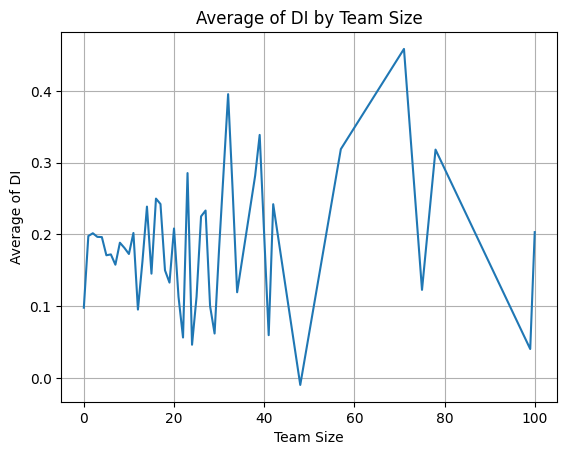

In [10]:
import matplotlib.pyplot as plt

# team_sizeごとにグループ化
grouped_df = scores_notna.groupby('team_size').mean()

# グラフの描画
plt.plot(grouped_df.index, grouped_df[1])
plt.xlabel('Team Size')
plt.ylabel('Average of DI')
plt.title('Average of DI by Team Size')
plt.grid(True)
plt.show()